In [67]:
import pandas as pd
import numpy as np
import  re
import networkx as nx
from tqdm import tqdm 
from IPython.utils import io
import plotly.offline as plotly
from plotly.graph_objs import *
from plotly import tools 
import matplotlib.pyplot as plt
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from scipy import sparse as sp
from sklearn.decomposition import PCA

# Preparing data for network

In [18]:
df = pd.read_csv('./network_data/df.csv')

In [25]:
data_scopus = pd.read_csv('./network_data/data_scopus.csv')

In [26]:
content = ''
content_list =[]
with open('./data/pubmed/set_DT.txt') as f:
    for line in f:
        content = content + line
        content_list.append(line)

In [27]:
#scrapping data from file
i=0
list_string=[]
while i<=(len(content_list)-2):
    s=''
    if (content_list[i]=='\n') and (bool(re.search('PMID', content_list[i+1]))):
        i+=1
        while content_list[i]!='\n' and i<(len(content_list)-1) :
            s= s + content_list[i]
            i+=1
        list_string.append(s)
    else:
        i+=1
print(len(list_string))

6549


In [28]:
pmid = []
authors = []
for item in list_string:
    pmid.append(re.findall('PMID- (.*)\n', item))
    authors.append(re.findall('AU - (.*)\n', item))
pmid_auth = {
        'pmid':pmid,
        'authors':authors}
data_network_auth = pd.DataFrame(pmid_auth)
for i in range(len(data_network_auth.pmid)):
    data_network_auth['pmid'][i] = data_network_auth['pmid'][i][0]

In [29]:
data_network_auth.head(1)

,pmid,authors
0,31738442,"[Ricciardi, Walter, Pita Barros, Pedro, Bourek..."


In [30]:
data_scopus['authors']=data_scopus['Authors'].str.split(',')

In [31]:
data_network_auth = pd.concat([data_scopus[['pmid','authors']],data_network_auth])

## Identify authors and papers
give id for each author

In [32]:
authors_df = pd.Series(data_network_auth.explode('authors')["authors"].str.replace(" ", "").unique()).to_frame()
authors_df.columns = ['author_name']
authors_df["author_id"] = authors_df.index + 1
authors_df.head()

,author_name,author_id
0,GordonN.K.,1
1,GordonR.,2
2,McClureM.J.,3
3,GargK.,4
4,SimpsonD.G.,5


In [33]:
#authors + papers
author_papers = data_network_auth.explode('authors')[['authors','pmid']] 

In [34]:
author_papers.reset_index(inplace=True)
author_papers.drop(['index'],inplace=True,axis=1)
author_papers.columns = ['author_name','pmid']
author_papers['author_name'] = author_papers['author_name'].str.replace(" ", "")
author_papers = pd.merge(author_papers,authors_df,on=['author_name'],how='left')

In [35]:
# save data
author_papers.to_csv('./network_data/author_papers.csv', index=False)
authors_df.to_csv('./network_data/authors.csv', index=False)
data_network_auth.to_csv('./network_data/data_network_auth.csv', index=False)

## Clustering

In [89]:
author_papers = pd.read_csv('./network_data/author_papers.csv')
authors_df = pd.read_csv('./network_data/authors.csv')
df = pd.read_csv('./network_data/df.csv')
data_network_auth = pd.read_csv('./network_data/data_network_auth.csv')

In [169]:
#check data
author_papers  = author_papers[author_papers['pmid'].isin(df['pmid'])]
author_papers.reset_index(inplace=True)
authors  = authors_df[authors_df['author_id'].isin(author_papers['author_id'])]

In [91]:
#merge data with topics LDA
authors_data = pd.merge(author_papers, df[[column for column in df.columns.values if 'topic' in column or column == 'pmid']],on=['pmid'],
        how='inner')
authors_data = authors_data[[column for column in authors_data if 'topic' in column or column == 'author_id']]

In [92]:
# prepare data for weight 
authors_data = authors_data.groupby('author_id').sum().reset_index()
total_count = author_papers.groupby('author_id').agg({'pmid':['count']})
total_count.columns = ['total_count']
total_count.reset_index(inplace=True)
authors_data = pd.merge(authors_data,total_count,on=['author_id'],how='left')
for column in authors_data.columns.values:
    if column != 'author_id' and column != 'total_count':
        authors_data[column] = authors_data[column] / authors_data['total_count']

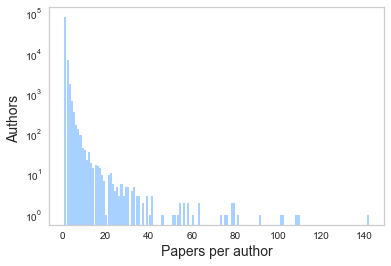

In [93]:
# see distribution of papers per author
plt.style.use('seaborn-pastel')
author_paper_counts = dict(zip(authors_data['author_id'], authors_data['total_count']))
xmin = min(author_paper_counts.values())
xmax = max(author_paper_counts.values())
bins = (xmax-xmin)
#plt.xlim(xmin-1, xmax+1)

ax = plt.hist(list(author_paper_counts.values()), bins=bins, log=2, width=0.95, alpha=0.8 );

axis_font = { 'size':'14'}
plt.xlabel('Papers per author', **axis_font)
plt.ylabel('Authors ', **axis_font)

plt.grid(0)
plt.show()

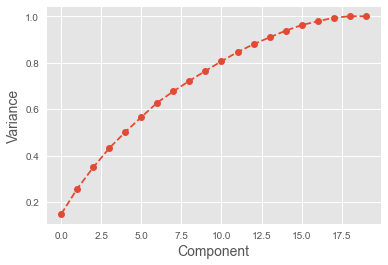

In [94]:
# understand how many compomemts need to describe variation
plt.style.use('ggplot')

pca = PCA().fit(authors_data[[column for column in authors_data.columns.values if column not in ['author_id','total_count']]].values)

ax = plt.plot(pca.explained_variance_ratio_.cumsum(), '--o')
axis_font = { 'size':'14'}

plt.xlabel('Component', **axis_font)
plt.ylabel('Variance', **axis_font)
plt.show()

From the plot above 17 and above seems enough to explain variation.

In [95]:
# prepare data for clustering model
pca = PCA(n_components=17, random_state=42)
authors_df_reduced= pca.fit_transform(authors_data[[column for column in authors_data.columns.values if column not in ['author_id','total_count']]].values)
authors_df_reduced.shape

(92074, 17)

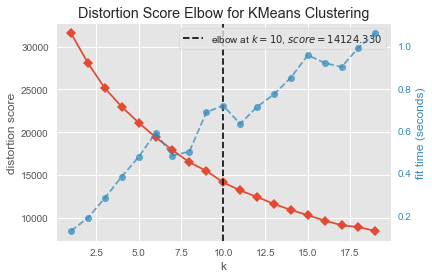

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [96]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,20))

visualizer.fit(authors_df_reduced)        # Fit the data to the visualizer
visualizer.show() 

###  k= 10

In [170]:
# implementing model
n_cluster = 10
kmeans = KMeans(n_clusters=n_cluster, random_state=42)
y_pred = kmeans.fit_predict(authors_df_reduced)
authors_data['label'] = y_pred

In [171]:
# to how topics are correlating with clusters
cls_means = authors_data[[column for column in authors_data.columns.values if 'topic' in column or column == 'label']].groupby('label').mean()
cls_means

,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10,topic_11,topic_12,topic_13,topic_14,topic_15,topic_16,topic_17,topic_18,topic_19
label,,,,,,,,,,,,,,,,,,,,
0,0.048819,0.116364,0.024553,0.111902,0.005566,0.002544,0.010584,0.040356,0.004455,0.008624,0.005152,0.009619,0.024211,0.008475,0.005553,0.543918,0.019729,0.004188,0.003405,0.001981
1,0.009752,0.014837,0.038788,0.012635,0.058307,0.078942,0.066590,0.008280,0.018714,0.015575,0.007919,0.005640,0.011049,0.015649,0.003555,0.014418,0.556264,0.010486,0.026760,0.025837
2,0.046354,0.534848,0.033101,0.058908,0.005005,0.005001,0.005832,0.026052,0.049185,0.038496,0.009242,0.012651,0.051162,0.006727,0.011443,0.041505,0.018733,0.029388,0.010115,0.006252
3,0.018737,0.026033,0.012129,0.028979,0.007842,0.015225,0.011278,0.030816,0.024448,0.060719,0.013863,0.017766,0.024106,0.029168,0.013316,0.010065,0.029012,0.594299,0.006854,0.025343
4,0.036769,0.035483,0.092338,0.049479,0.068186,0.073076,0.030742,0.027665,0.049324,0.103761,0.040237,0.027809,0.083329,0.027254,0.020893,0.022835,0.060590,0.029953,0.044128,0.076150
5,0.013387,0.048952,0.020071,0.046274,0.005030,0.002610,0.004778,0.526256,0.008846,0.012292,0.028067,0.042680,0.029668,0.011459,0.019181,0.101222,0.027577,0.032124,0.011841,0.007687
6,0.046014,0.045785,0.039946,0.601301,0.005343,0.002658,0.004142,0.040067,0.007918,0.027263,0.006551,0.009212,0.050796,0.005532,0.005132,0.052310,0.018460,0.022297,0.006097,0.003177
7,0.006619,0.012301,0.011514,0.012779,0.003669,0.004504,0.006048,0.018464,0.007237,0.039322,0.116314,0.289725,0.012655,0.353256,0.019606,0.009281,0.028186,0.030920,0.004266,0.013335
8,0.008556,0.010960,0.011216,0.007924,0.049254,0.103409,0.542607,0.003959,0.021054,0.006402,0.005260,0.001821,0.005589,0.006678,0.002323,0.010467,0.147463,0.005747,0.030541,0.018768


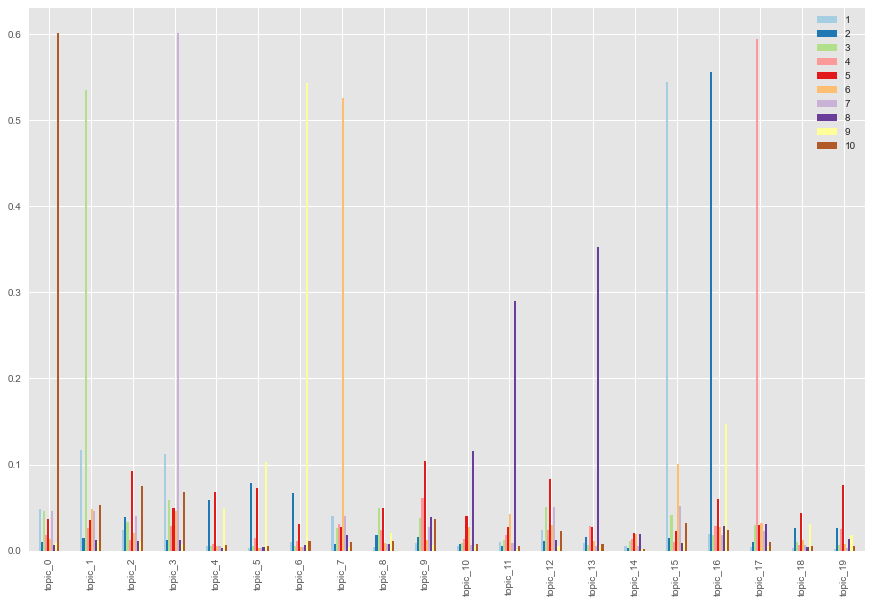

In [100]:
# vizualization of comparing topics and clusters
transposedMeans = cls_means.T
transposedMeans.columns = [str(int(column)+1) for column in transposedMeans.columns.values]
ax = transposedMeans.plot(kind='bar', label='index', colormap='Paired',figsize=(15,10))

plt.show()

# Network analysis

In [101]:
# prepare data
int_p_id = dict(enumerate(list(author_papers['pmid'].unique())))
int_a_id = dict(enumerate(list(author_papers['author_id'].unique())))

a_int_id = {authorId:intVal for intVal,authorId in int_a_id.items()}
p_int_id = {paperId:intVal for intVal,paperId in int_p_id.items()}

In [102]:
filterAuthors = dict(zip(author_papers['author_id'].value_counts().keys(),author_papers['author_id'].value_counts().values))
# i have some problems with power of calculating, that's why use this filter
filterAuthors = list([authorId for authorId,paperCount in filterAuthors.items() if paperCount>2])

int_p_id = dict(enumerate(list(author_papers[author_papers['author_id'].isin(filterAuthors)]['pmid'].unique())))
int_a_id = dict(enumerate(list(author_papers[author_papers['author_id'].isin(filterAuthors)]['author_id'].unique())))

a_int_id = {authorId:intVal for intVal,authorId in int_a_id.items()}
p_int_id = {paperId:intVal for intVal,paperId in int_p_id.items()}

In [103]:

author_paper_tuples = list(zip(author_papers[author_papers['author_id'].isin(filterAuthors)]['author_id'],author_papers[author_papers['author_id'].isin(filterAuthors)]['pmid']))
author_paper_tuples = [(a_int_id[t[0]],p_int_id[t[1]]) for t in author_paper_tuples]

#AP[i,j] = 1 indicates that author i published paper j
AP = sp.csc_matrix((np.ones(len(author_paper_tuples)), zip(*author_paper_tuples)))

##AA[i,j] = 1 indicates that author i published a paper with author j

AA = AP.dot(AP.T)

In [104]:
#remove diagonal
AA = np.array(AA - np.diag(AA.diagonal()))

In [105]:
#construct graph
G = nx.from_numpy_matrix(AA, parallel_edges=True)

In [106]:
# calculate main graph's characteristics
deg_measure = nx.degree(G) 
cent_measure = nx.degree_centrality(G) 
bet_measure = nx.betweenness_centrality(G)

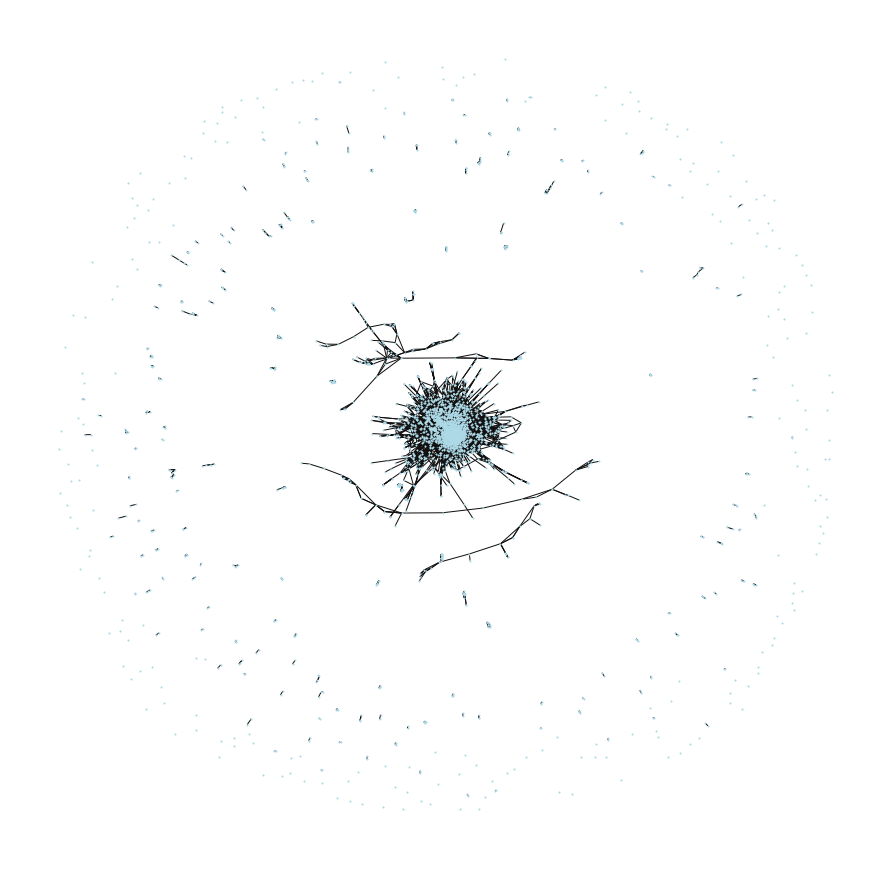

In [107]:
plt.figure(3,figsize=(12,12)) 
nx.draw(G, with_labels=False, node_size = 2, node_color = 'lightblue') 

In [108]:
AP.shape

(3565, 7562)

In [109]:
authors = authors[authors['author_id'].isin(filterAuthors)]
authors['degree'] = authors['author_id'].apply(lambda l: deg_measure[a_int_id.get(l)])
authors['degree_cent'] = authors['author_id'].apply(lambda l: cent_measure[a_int_id.get(l)])
authors['degree_bet'] = authors['author_id'].apply(lambda l: bet_measure.get(a_int_id.get(l)))
authors_data = pd.merge(authors_data,authors[['author_id','degree','degree_cent','degree_bet']],on=['author_id'],how='left')

Text(0, 0.5, 'degree')

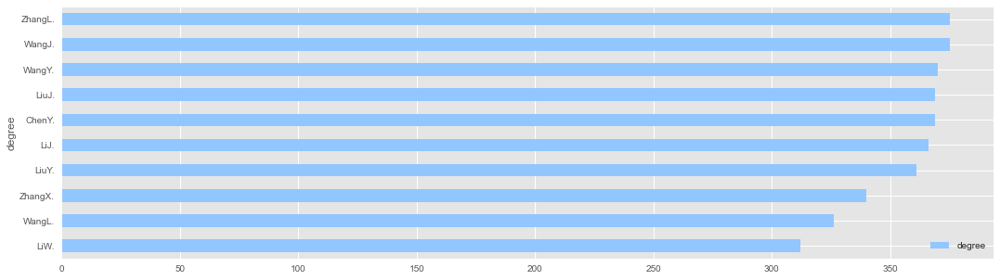

In [110]:

plt.style.use('seaborn-pastel')
degree_sort = authors.sort_values(by=['degree'],ascending=False)[0:10][['author_name','degree']]
degree_sort = degree_sort.set_index('author_name')
ax = degree_sort.plot.barh(rot=0,figsize=(18,5))
ax.invert_yaxis()  
plt.ylabel("degree")

Text(0, 0.5, 'degree_centrality')

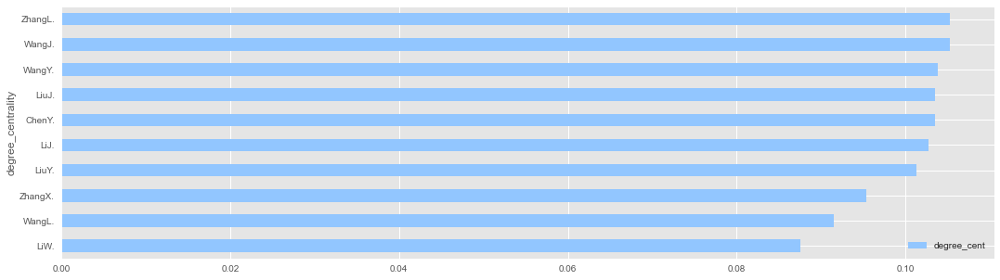

In [111]:
degree_sort = authors.sort_values(by=['degree_cent'],ascending=False)[0:10][['author_name','degree_cent']]
degree_sort = degree_sort.set_index('author_name')
ax = degree_sort.plot.barh(rot=0,figsize=(18,5))
ax.invert_yaxis()
plt.ylabel("degree_centrality")


Text(0, 0.5, 'degree_betwenness')

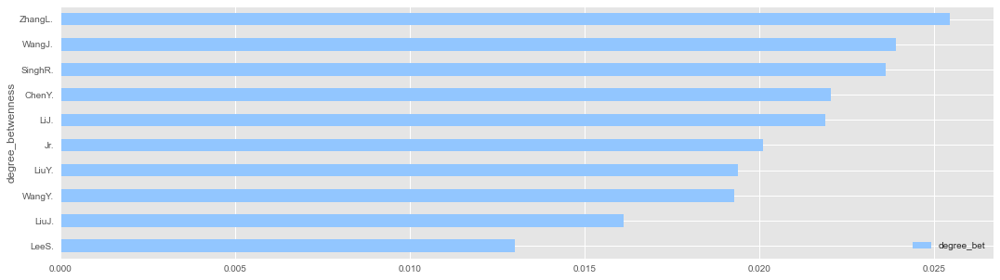

In [112]:
degree_sort = authors.sort_values(by=['degree_bet'],ascending=False)[0:10][['author_name','degree_bet']]
degree_sort = degree_sort.set_index('author_name')
ax = degree_sort.plot.barh(rot=0,figsize=(18,5))
ax.invert_yaxis()  # labels read top-to-bottom
plt.ylabel("degree_betwenness")

In [113]:
print(G.number_of_edges(), G.number_of_nodes(), nx.density(G)) 

40913 3565 0.006440121961393584


# Vizualization

 - The size of the node is proportional to the co-authorships of the author (how many there is).
 - Colors represent the class of the author (the research interests by LDA topics) in the network.
 - Every nodes displays information about the author

In [114]:
author_classes = dict(zip(authors_data.author_id, authors_data.label))

In [115]:
cls_names ={0: 'label1', 1: 'label2', 2: 'label3', 3: 'label4', 4: 'label5', 5:'label6',6:'label7',7:'label8',8:'label9',9:'label9'}

filterAuthors = dict(zip(author_papers['author_id'].value_counts().keys(),author_papers['author_id'].value_counts().values))
filterAuthors = [authorId for authorId,paperCount in filterAuthors.items() if paperCount>2]

#subnetwork
G1 = G.subgraph([a_int_id[i] for i in filterAuthors])
print(G1.number_of_edges(), G1.number_of_nodes())

40913 3565


In [116]:
node_pos= nx.spring_layout(G1, iterations=50)

In [117]:
groups=[]
for node in tqdm(G1.nodes()):
    groups.append(author_classes[int_a_id[node]])
    
group_colors = {0:'deepskyblue', 1:'green', 2:'orange', 3:'salmon',4:'purple',5:'peru',6:'orange',7:'darkmagenta',8:'maroon',9:'aqua'}
##match authornames with authorids
a_id_name = dict(zip(authors.author_id, authors.author_name))

  0%|          | 0/3565 [00:00<?, ?it/s]

In [118]:
plotly.init_notebook_mode(connected=True)

edge_trace = Scatter(
    x=[],
    y=[],
    line=Line(width=0.5,color='#888'),
    hoverinfo='none',
    mode='lines')
x_list = []
y_list = []
for edge in tqdm(G1.edges(data=True)):
    
    x0, y0 = node_pos[edge[0]]
    x1, y1 = node_pos[edge[1]]
    x_list = list(edge_trace['x'])
    x_list += [x0, x1]
    edge_trace['x'] = tuple(x_list)
    y_list = list(edge_trace['y'])
    y_list += [y0, y1]
    edge_trace['y'] = tuple(y_list)

print("done with edges")

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




  0%|          | 0/40913 [00:00<?, ?it/s]

done with edges


In [125]:
node_trace = Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=Marker(
        showscale=True,
        colorscale='Jet',
        color=groups,
        size=[],
        colorbar=dict(
            title='Class',
            tickvals = [i for i in range(10)],
            ticktext = [cls_names[i] for i in range(10)],
            ticks = 'outside'
        ),
        line=dict(width=1)))
x_list = []
y_list = []
for node in tqdm(G1.nodes()):
    x, y = node_pos[node]#G.node[node]['pos']
    x_list = list(node_trace['x'])
    x_list += [x]
    y_list = list(node_trace['y'])
    y_list += [y]
    node_trace['x'] = tuple(x_list)
    node_trace['y'] = tuple(y_list)

  0%|          | 0/3565 [00:00<?, ?it/s]

In [126]:
node_deg = G1.degree()
node_trace['marker']['size'] =[]
node_trace['marker']['color'] =[]
node_trace['text'] =[]
max_degree = max([node[1] for node in node_deg])
marker_size_list = []
marker_text_list = []
marker_color_list = []
for node in tqdm(G1.nodes()):
    marker_size_list = list(node_trace['marker']['size'])
    marker_size_list += [100*(node_deg[node])/max_degree]
    node_trace['marker']['size'] = tuple(marker_size_list)
    name = a_id_name.get(int_a_id[node])
    node_info = '# of connections: %s <br />AuthorName: %s <br />AuthorID: %s <br />Label: %s'%(str(node_deg[node]), str(name),str(int_a_id[node]),
                                                                                               str(author_classes[int_a_id[node]]))
    marker_text_list = list(node_trace['text'])
    marker_text_list += [node_info]
    node_trace['text'] = tuple(marker_text_list)
    marker_color_list = list(node_trace['marker']['color'])
    marker_color_list += [author_classes[int_a_id[node]]]
    node_trace['marker']['color'] = tuple(marker_color_list)

  0%|          | 0/3565 [00:00<?, ?it/s]

In [127]:
fig = Figure(data=Data([edge_trace, node_trace]),
             layout=Layout(
                title='<br>Collaboration Network',
                titlefont=dict(size=16),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=10,l=10,r=5,t=40),
                xaxis=XAxis(autorange=True, showgrid=False, zeroline=False, showticklabels=False),
                yaxis=YAxis(autorange=True, showgrid=False, zeroline=False, showticklabels=False)))

plotly.iplot(fig, filename='collaboration_network_vis')

We can see that one of the cluster is the most important and is the biggest for this network. The next step is to identify how many authors and papers include

In [160]:
aut=[]
for key,value in author_classes.items():
    if value == 4 and key in authors.author_id:
        aut.append(key)
        
len(aut)

1293

In [168]:
pmid_check = list(author_papers[author_papers['author_id'].isin(aut)]['pmid'].unique())
len(pmid_check)

3251

In [163]:
df[df['pmid'].isin(pmid_check)][[column for column in df.columns.values if 'topic' in column]].describe()

,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10,topic_11,topic_12,topic_13,topic_14,topic_15,topic_16,topic_17,topic_18,topic_19
count,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000,3251.000000
mean,0.067326,0.072660,0.058625,0.096425,0.040731,0.044639,0.049663,0.044256,0.027531,0.057046,0.030059,0.046817,0.053862,0.050548,0.012761,0.039582,0.096926,0.051979,0.026246,0.032317
std,0.170315,0.163597,0.138035,0.199480,0.120869,0.127942,0.141453,0.125016,0.081457,0.137074,0.100420,0.142571,0.136800,0.147887,0.048589,0.116592,0.186368,0.146380,0.088354,0.101305
min,0.000066,0.000066,0.000095,0.000066,0.000095,0.000160,0.000066,0.000066,0.000095,0.000066,0.000066,0.000066,0.000066,0.000066,0.000066,0.000095,0.000095,0.000066,0.000095,0.000150
25%,0.000391,0.000397,0.000400,0.000403,0.000385,0.000394,0.000385,0.000391,0.000394,0.000407,0.000388,0.000394,0.000397,0.000389,0.000382,0.000382,0.000417,0.000397,0.000382,0.000394
50%,0.000532,0.000562,0.000562,0.000588,0.000505,0.000526,0.000515,0.000532,0.000526,0.000568,0.000515,0.000526,0.000543,0.000521,0.000495,0.000505,0.000625,0.000532,0.000500,0.000515
75%,0.016667,0.049409,0.028549,0.073344,0.000893,0.000962,0.000962,0.001515,0.000926,0.018039,0.000862,0.001000,0.016667,0.001000,0.000769,0.001064,0.113087,0.001087,0.000820,0.000862
max,0.993165,0.991284,0.983333,0.992520,0.878799,0.994172,0.992520,0.993987,0.855518,0.994379,0.993165,0.993667,0.993871,0.991121,0.815455,0.990206,0.994693,0.994242,0.893189,0.995870


if we can see the main cluster consists of 1293 authors and 3251 papers. From thematic model  main topics are topic_3 and topic_16. The next step is to evaluate the network clustering by others methods 

# Another methods of clusterization

In [141]:
import urllib
import networkx as nx
import matplotlib.pyplot as plt

from scipy import sparse as sp
from sklearn.metrics import roc_auc_score, average_precision_score

from node2vec import Node2Vec
from node2vec.edges import HadamardEmbedder

from sklearn.linear_model import LogisticRegression
from sklearn.metrics.pairwise import euclidean_distances, cosine_distances

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN

import numpy as np
from tqdm.notebook import tqdm
%matplotlib inline

In [142]:
def getEmbeddingsMatrix(adjacencyMatrix, word2VecModel):
    emb_list = []
    for node_index in range(0, adjacencyMatrix.shape[0]):
        node_str = str(node_index)
        node_emb = word2VecModel.wv[node_str]
        emb_list.append(node_emb)
    return np.vstack(emb_list)

In [143]:
G2 = nx.convert_node_labels_to_integers(G)
adjacencyMatrix = nx.to_scipy_sparse_matrix(G)

node2vec = Node2Vec(G2, dimensions=128, walk_length=150, num_walks=30, p = 1.0, q = 1.0)
model = node2vec.fit(window = 10)

embeddingsMatrix = getEmbeddingsMatrix(adjacencyMatrix, model)

/var/folders/0d/7rwsnbd936d6v32kctnxnw4w0000gn/T/ipykernel_26312/499199823.py:2: DeprecationWarning:



The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `to_scipy_sparse_array` instead.



Computing transition probabilities:   0%|          | 0/3565 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|████████████████| 30/30 [02:26<00:00,  4.88s/it]


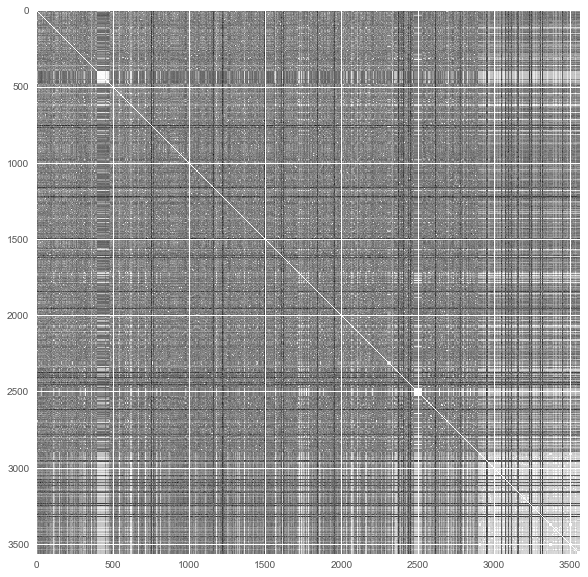

In [177]:
distanceMatrix = cosine_distances(embeddingsMatrix);
plt.figure(figsize=(20, 10));
plt.imshow(distanceMatrix, cmap = 'Greys', interpolation = 'None');

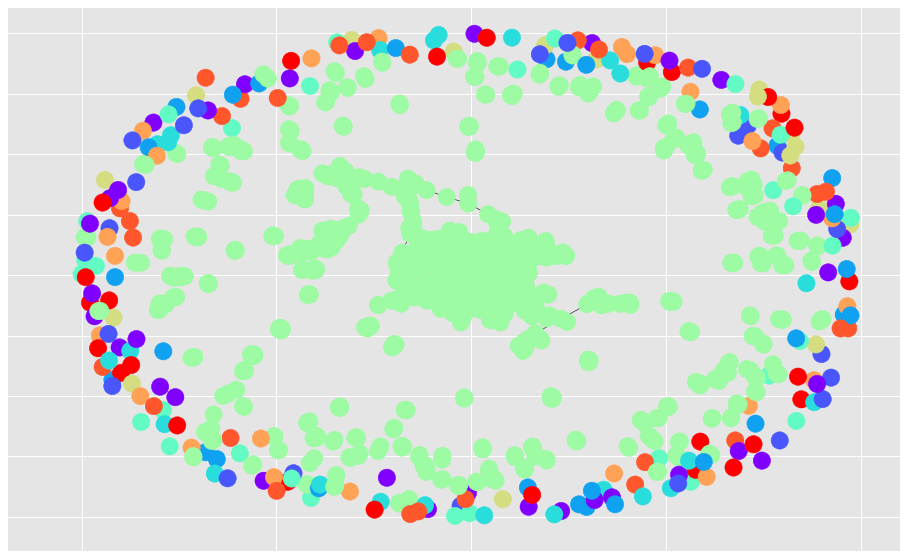

In [172]:
# use 10 clusters
clusters = AgglomerativeClustering(n_clusters=10, affinity = 'precomputed', linkage='complete').fit_predict(distanceMatrix)

plt.figure(figsize=(16, 10))
nx.draw_networkx(G2, node_color=clusters, width=0.6, with_labels=False,cmap = 'rainbow')

We can see the same. One big cluster and many little communities without strict separation. Let's check the hyphotesis that we have only two clusters

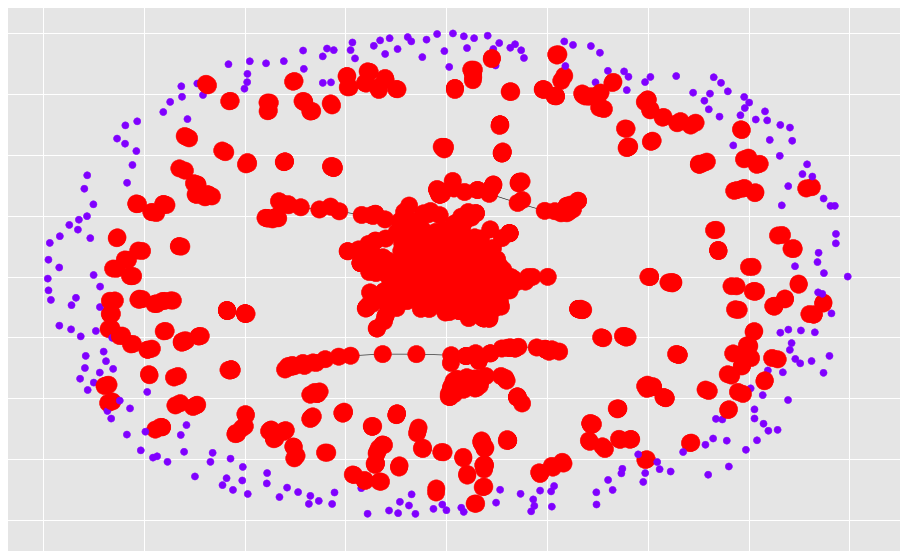

In [148]:
clusters = DBSCAN(eps=0.53, min_samples=22, metric = 'precomputed').fit_predict(distanceMatrix)
plt.figure(figsize=(16, 10))
sizes = [300 if clusters[i] >= 0 else 50 for i in range(len(clusters))]
nx.draw_networkx(G, node_color=clusters, node_size=sizes, width=0.6, with_labels=False,cmap = 'rainbow')

From DBSCAN we can see one big cluster of authors, which is most powerful and bigger and other cluster that came from the first one